In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import os
import sys
import tempfile
import pyabc

import healpy as hp
from astropy.coordinates import SkyCoord, Angle
import astropy.units as u
import pandas as pd

sys.path.insert(0, '/home/aew492/lss-dipoles/code')
import tools
import dipole
from abc_with_fake_data import model, distance
import generate_mocks as gm
import multipoles

#### test new model with excess dipole

In [3]:
nside = 64
# expected dipole direction
cmb_dipdir = SkyCoord(264, 48, unit=u.deg, frame='galactic')

# (theta, phi) in each healpixel
theta, phi = hp.pix2ang(nside, ipix=np.arange(hp.nside2npix(nside)))

selfunc = np.ones(hp.nside2npix(nside))
base_rate = 33.6330  # mean base rate of the final 100 accepted samples for Quaia, 14 generations
expected_dipole_amp = 0.0052
data_pars = dict(dipole_amp=expected_dipole_amp, log_excess=-4)
ell_max = 8
poisson = True

In [4]:
# get orthogonal dipole amps
comps = tools.spherical_to_cartesian(r=0.0052,
                                        theta=np.pi/2-cmb_dipdir.icrs.dec.rad,
                                        phi=cmb_dipdir.icrs.ra.rad)
# antiparallel
comps_anti = -comps
# orthogonal to amps
comps_perp = np.ones_like(comps)  # gotta start with any 3-vector
comps_perp -= comps_perp.dot(comps) * comps # / np.linalg.norm(amps)**2  # make it perpendicular (Gram-Schmidt)
print(np.linalg.norm(comps_perp))
comps_perp /= np.linalg.norm(comps_perp)
print(np.linalg.norm(comps_perp))
comps_perp *= np.linalg.norm(comps)
print(np.linalg.norm(comps_perp))

1.7320386009574384
1.0
0.0052


In [5]:
# check antiparallel and orthogonality using dot product
print(np.dot(comps, comps_anti) / (np.linalg.norm(comps) * np.linalg.norm(comps_anti)))
print(np.dot(comps, comps_perp))

-1.0
-1.3804290116022206e-05


In [6]:
dmap = dipole.dipole(theta, phi, *comps)
anti_dmap = dipole.dipole(theta, phi, *comps_anti)
perp_dmap = dipole.dipole(theta, phi, *comps_perp)

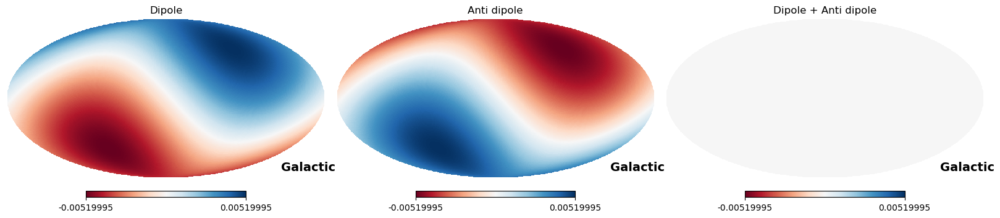

In [7]:
fig = plt.figure(figsize=(16,4))
vmin = -np.max(dmap)
vmax = np.max(dmap)
kwargs = dict(coord=['C','G'], min=vmin, max=vmax, cmap='RdBu')
hp.mollview(dmap, sub=(1,3,1), title='Dipole', **kwargs)
hp.mollview(anti_dmap, sub=(1,3,2), title='Anti dipole', **kwargs)
hp.mollview(dmap + anti_dmap, sub=(1,3,3), title='Dipole + Anti dipole', **kwargs)

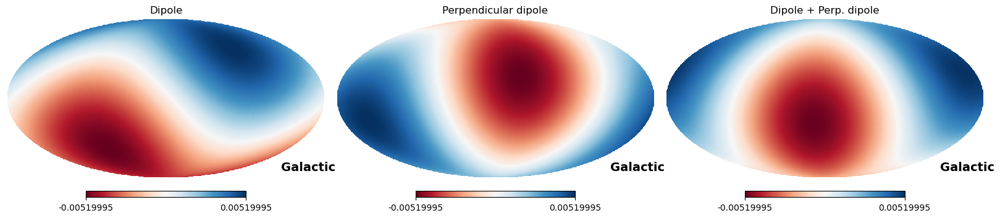

In [8]:
fig = plt.figure(figsize=(16,4))
vmin = -np.max(dmap)
vmax = np.max(dmap)
kwargs = dict(coord=['C','G'], min=vmin, max=vmax, cmap='RdBu')
hp.mollview(dmap, sub=(1,3,1), title='Dipole', **kwargs)
hp.mollview(perp_dmap, sub=(1,3,2), title='Perpendicular dipole', **kwargs)
hp.mollview(dmap + perp_dmap, sub=(1,3,3), title='Dipole + Perp. dipole', **kwargs)

In [9]:
# test models
pars = dict(log_excess=-8, dipole_amp=0.0052)
data = model(pars, selfunc, base_rate, cmb_dipdir, theta, phi, ell_max, poisson=False)
data_anti = model(pars, selfunc, base_rate, cmb_dipdir, theta, phi, ell_max, poisson=False,
                 excess_dipole_comps=comps_anti)
data_perp = model(pars, selfunc, base_rate, cmb_dipdir, theta, phi, ell_max, poisson=False,
                 excess_dipole_comps=comps_perp)

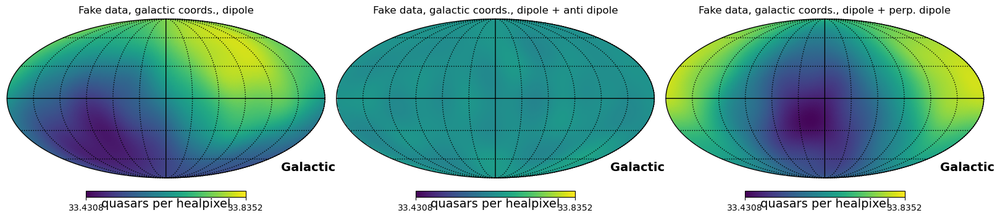

In [10]:
fig = plt.figure(figsize=(16,4))
kwargs = dict(coord=['C','G'], fig=fig, unit='quasars per healpixel', min=np.mean(data['data'])-2*np.std(data['data']),
             max=np.mean(data['data'])+2*np.std(data['data']))
hp.mollview(data['data'], title='Fake data, galactic coords., dipole', sub=(1,3,1), **kwargs)
hp.mollview(data_anti['data'], title='Fake data, galactic coords., dipole + anti dipole', sub=(1,3,2), **kwargs)
hp.mollview(data_perp['data'], title='Fake data, galactic coords., dipole + perp. dipole', sub=(1,3,3), **kwargs)
hp.graticule()

### load results

In [11]:
resdir = '/scratch/aew492/lss-dipoles_results/results/ABC/fake_data'
nside = 64

In [12]:
def case_dir(dipamp, log_excess, base_rate, tag=''):
    return os.path.join(resdir, f'dipole-{dipamp:.4f}_excess-1e{log_excess}_base-rate-{base_rate:.4f}{tag}')

#### Quaia-like: expected dipole + excess power (1e-6), _purposefully low excess power prior_

In [13]:
input_dipamp = 0.0052
input_log_excess = -6
base_rate = 33.6330

In [14]:
nmocks = 500
ngens = 15

# need a temp check with this
fn = 'sqlite:///' + os.path.join(case_dir(input_dipamp, input_log_excess, base_rate, '_low-excess-prior'),
                                                    f'{nmocks}mocks_{ngens}gens', 'history.db')
history = pyabc.History('sqlite:///' + os.path.join(case_dir(input_dipamp, input_log_excess, base_rate, '_low-excess-prior'),
                                                    f'{nmocks}mocks_{ngens}gens', 'history.db'))

In [15]:
# manually construct prior
prior = {
    'dipole_amp' : (0., 3. * input_dipamp),
    'log_excess' : (-10, 3)
}

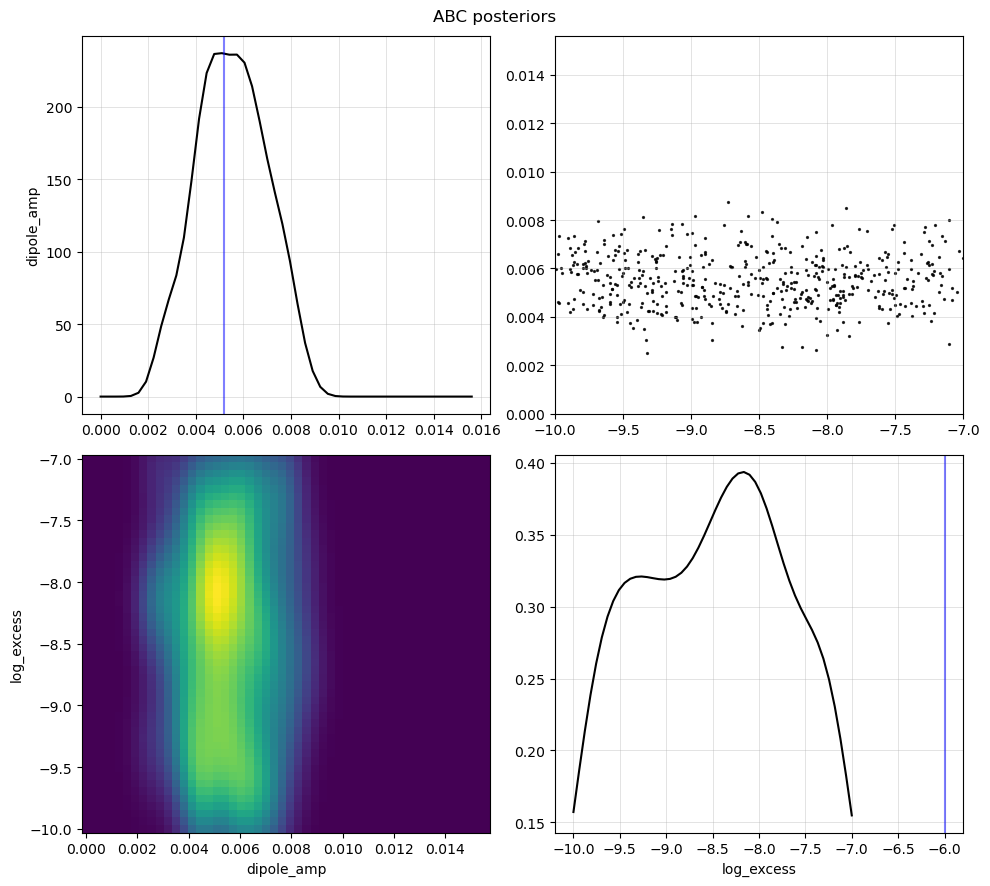

In [16]:
tools.plot_posterior(history, prior, true_dipamp=input_dipamp, true_log_excess=input_log_excess)

#### Quaia-like: expected dipole + excess power (1e-4), _purposefully low excess power prior_

In [18]:
input_dipamp = 0.0052
input_log_excess = -4
base_rate = 33.6330

nmocks = 500
ngens = 14

resdict = np.load(os.path.join(case_dir(input_dipamp, input_log_excess, base_rate, '_low-excess-prior'),
                               f'{nmocks}mocks_{ngens}gens', 'results.npy'),
                  allow_pickle=True).item()
data = resdict['data']  # the data as raw quasar counts
observation = resdict['observation']  # the data as overdensity
history = resdict['history']  # History object
prior = resdict['prior']  # dictionary
posterior = resdict['posterior']  # pandas dataframe and weights associated with the final posterior
old_posteriors = resdict['old_posteriors']  # posteriors from the otehr generations

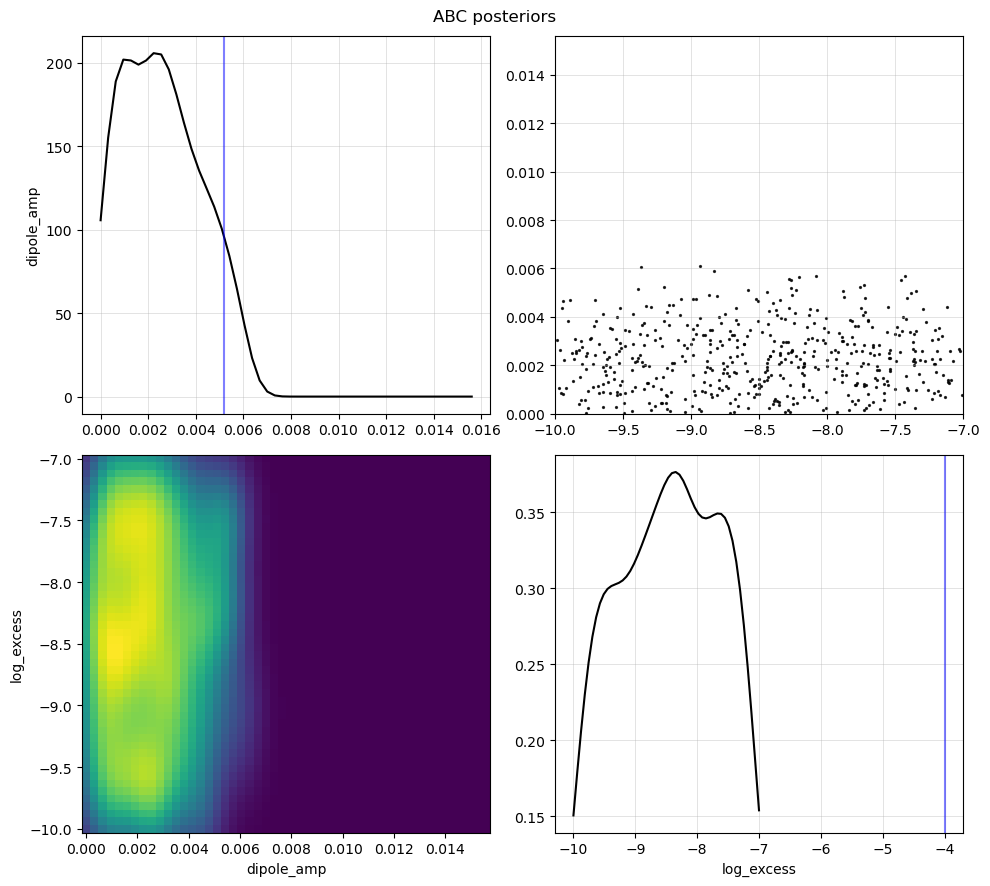

In [19]:
tools.plot_posterior(history, prior, true_dipamp=input_dipamp, true_log_excess=input_log_excess)

In [20]:
# okay but what is the total dipole in this (i.e. including the "excess power dipole")
dipcomps = hp.fit_dipole(observation)[1]
dipamp, dipdir = dipole.get_dipole(dipcomps)
print(f"best-fit dipole is {dipamp:.5f} in {dipdir.galactic}")

# and the input kinematic dipole
cmb_dipdir = SkyCoord(264, 48, unit=u.deg, frame='galactic')
comps = tools.spherical_to_cartesian(r=input_dipamp,
                                    theta=np.pi/2-cmb_dipdir.icrs.dec.rad,
                                    phi=cmb_dipdir.icrs.ra.rad)

# turn these into maps
dmap = dipole.dipole_map([0, *comps])
bestfit_dmap = dipole.dipole_map([0., *dipcomps])

best-fit dipole is 0.00543 in <SkyCoord (Galactic): (l, b) in deg
    (221.18392117, -7.83667426)>


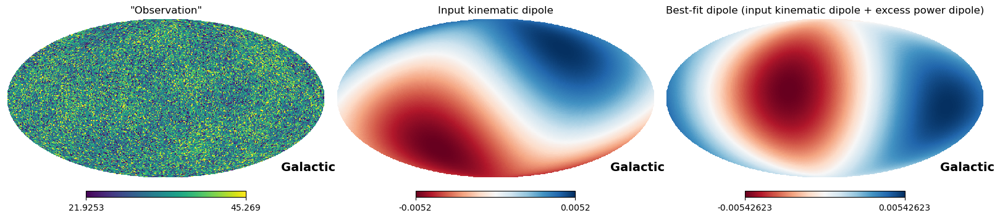

In [21]:
fig = plt.figure(figsize=(16,4))
kwargs = dict(coord=['C','G'])
hp.mollview(data['data'], sub=(1,3,1), title=f'"Observation"', min=np.mean(data['data'])-2*np.std(data['data']),
            max=np.mean(data['data'])+2*np.std(data['data']), **kwargs)
hp.mollview(dmap, sub=(1,3,2), title=f'Input kinematic dipole', min=-input_dipamp, max=input_dipamp, cmap='RdBu', **kwargs)
hp.mollview(bestfit_dmap, sub=(1,3,3), title=f'Best-fit dipole (input kinematic dipole + excess power dipole)', cmap='RdBu', **kwargs)

In [22]:
# projection of the best-fit dipole on kinematic dipole direction?
proj = (np.dot(dipcomps, comps)/np.linalg.norm(comps)**2)*comps
np.linalg.norm(proj)

0.002088728808239324

In [23]:
# this matches the posterior! yay!
# so no clear bugs, but this doesn't immediately explain the lack of "dipole amplitude compensation" given that we've 
#  forced the excess power prior to be low

#### Quaia-like: expected dipole + excess power (1e-4), _no shot noise_, _purposefully low excess power prior_

In [24]:
input_dipamp = 0.0052
input_log_excess = -4
base_rate = 33.6330

nmocks = 500
ngens = 12

resdict = np.load(os.path.join(case_dir(input_dipamp, input_log_excess, base_rate, '_no-SN_low-excess-prior'),
                               f'{nmocks}mocks_{ngens}gens', 'results.npy'),
                  allow_pickle=True).item()
data = resdict['data']  # the data as raw quasar counts
observation = resdict['observation']  # the data as overdensity
history = resdict['history']  # History object
prior = resdict['prior']  # dictionary
posterior = resdict['posterior']  # pandas dataframe and weights associated with the final posterior
old_posteriors = resdict['old_posteriors']  # posteriors from the otehr generations

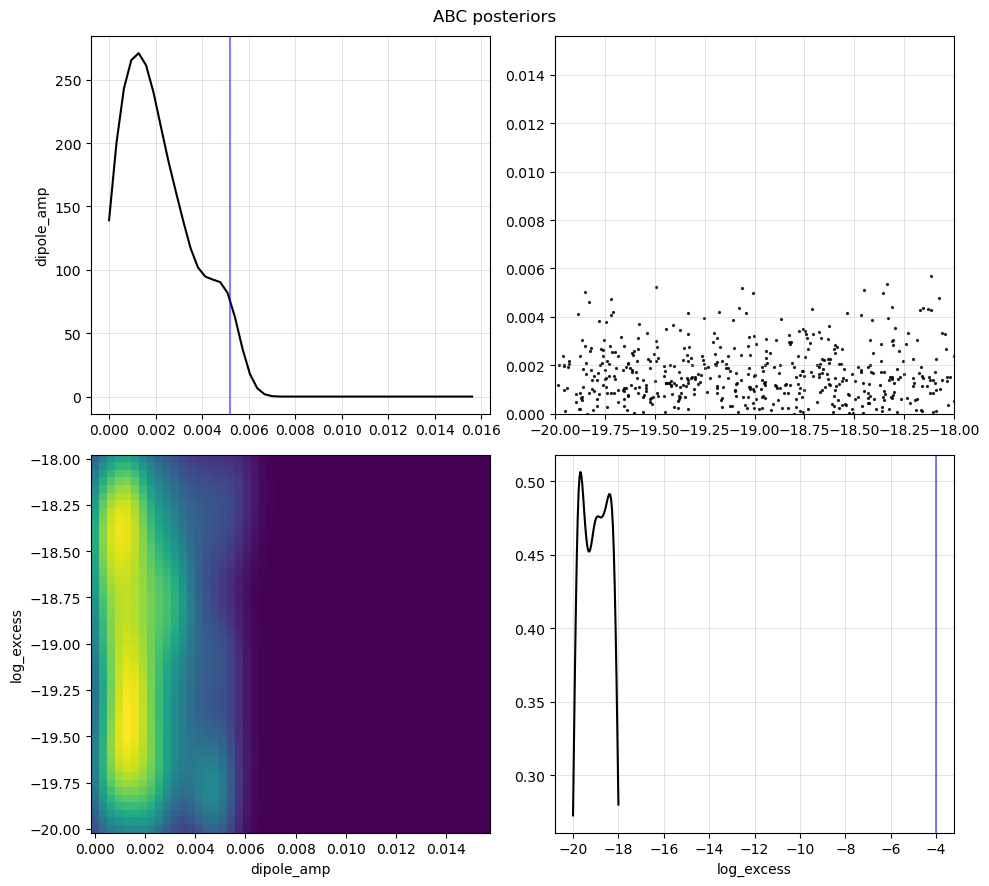

In [25]:
tools.plot_posterior(history, prior, true_dipamp=input_dipamp, true_log_excess=input_log_excess)

best-fit dipole is 0.01097 in <SkyCoord (Galactic): (l, b) in deg
    (197.62773835, -30.50799771)>


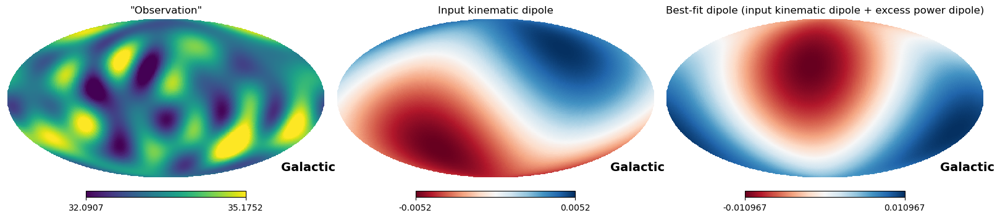

In [26]:
# total dipole?
dipcomps = hp.fit_dipole(observation)[1]
dipamp, dipdir = dipole.get_dipole(dipcomps)
print(f"best-fit dipole is {dipamp:.5f} in {dipdir.galactic}")

# and the input kinematic dipole
cmb_dipdir = SkyCoord(264, 48, unit=u.deg, frame='galactic')
comps = tools.spherical_to_cartesian(r=input_dipamp,
                                    theta=np.pi/2-cmb_dipdir.icrs.dec.rad,
                                    phi=cmb_dipdir.icrs.ra.rad)

# turn these into maps
dmap = dipole.dipole_map([0, *comps])
bestfit_dmap = dipole.dipole_map([0., *dipcomps])

fig = plt.figure(figsize=(16,4))
kwargs = dict(coord=['C','G'])
hp.mollview(data['data'], sub=(1,3,1), title=f'"Observation"', min=np.mean(data['data'])-2*np.std(data['data']),
            max=np.mean(data['data'])+2*np.std(data['data']), **kwargs)
hp.mollview(dmap, sub=(1,3,2), title=f'Input kinematic dipole', min=-input_dipamp, max=input_dipamp, cmap='RdBu', **kwargs)
hp.mollview(bestfit_dmap, sub=(1,3,3), title=f'Best-fit dipole (input kinematic dipole + excess power dipole)', cmap='RdBu', **kwargs)

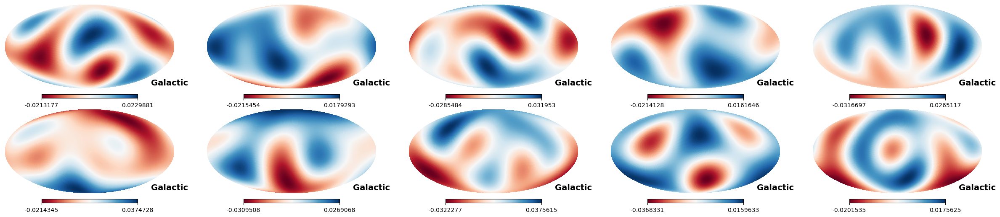

In [31]:
# double check that hp.synfast is truly random since this total dipole looks coincidentally similar in direction to the one above
n = 10
Cells = np.ones(4) * 1e-4

fig = plt.figure(figsize=(24,5))
for i in range(n):
    odmap = hp.sphtfunc.synfast(Cells, nside=64)
    hp.mollview(odmap, coord=['C','G'], cmap='RdBu', sub=(2, 5, i+1), title='')

#### Quaia-like: expected dipole + excess power (1e-4), _no shot noise_, _purposefully low excess power prior_, _**antiparallel**_ excess dipole

** Critically, this setup means that the total dipole is in the opposite direction on the sky as in the kinematic dipole expectation (see plots below)!

In [32]:
input_dipamp = 0.0052
input_log_excess = -4
base_rate = 33.6330

nmocks = 500
ngens = 12

resdict = np.load(os.path.join(case_dir(input_dipamp, input_log_excess, base_rate, '_no-SN_low-excess-prior_antipar-dipole'),
                               f'{nmocks}mocks_{ngens}gens', 'results.npy'),
                  allow_pickle=True).item()
data = resdict['data']  # the data as raw quasar counts
observation = resdict['observation']  # the data as overdensity
history = resdict['history']  # History object
prior = resdict['prior']  # dictionary
posterior = resdict['posterior']  # pandas dataframe and weights associated with the final posterior
old_posteriors = resdict['old_posteriors']  # posteriors from the otehr generations

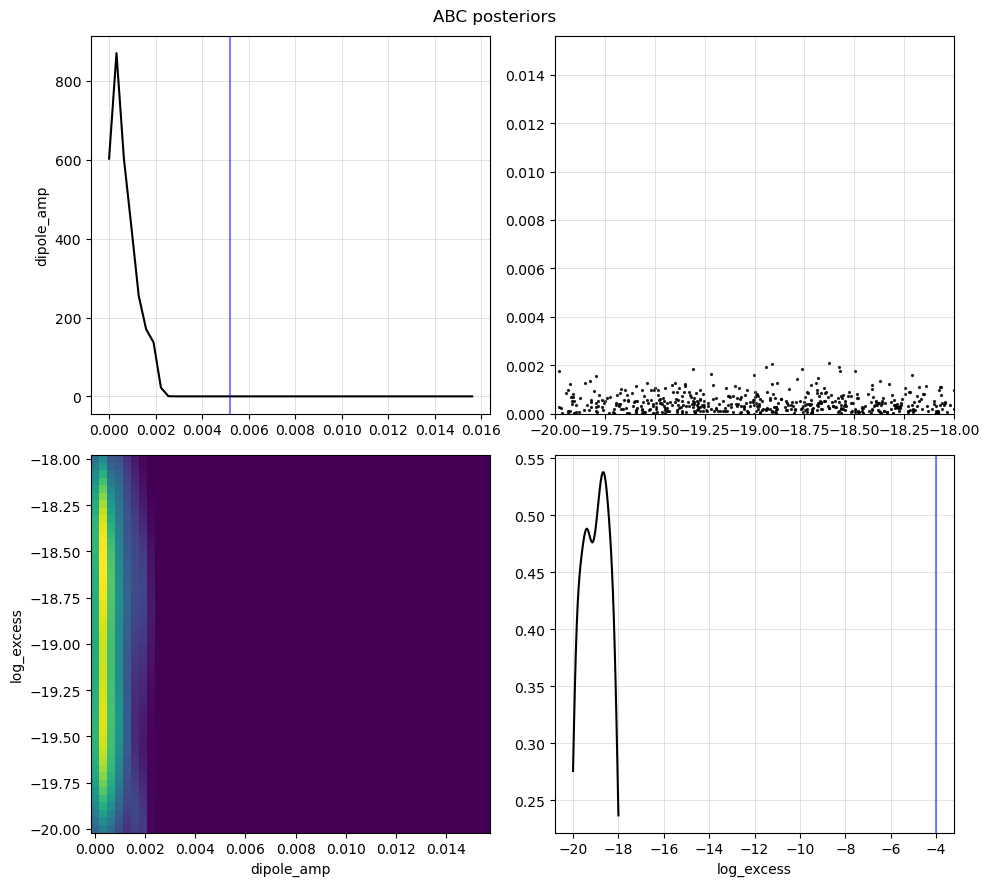

In [33]:
tools.plot_posterior(history, prior, true_dipamp=input_dipamp, true_log_excess=input_log_excess)

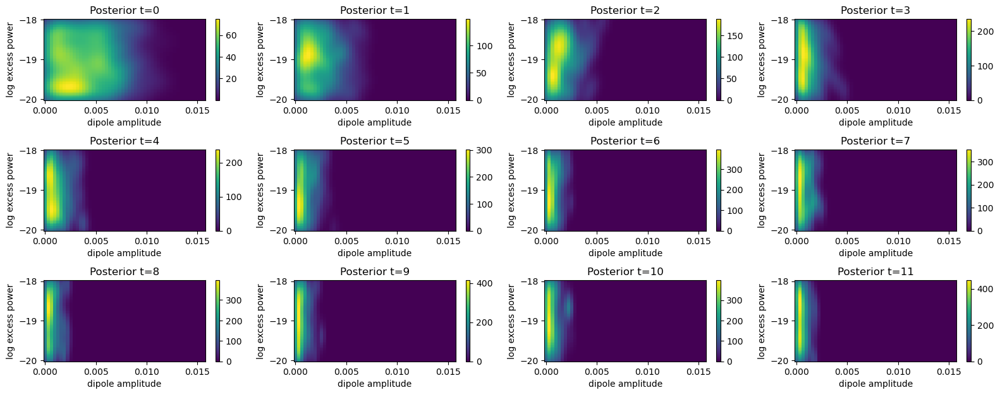

In [35]:
# evolution of the posterior
fig = plt.figure(figsize=(16, 8), tight_layout=True)
for i, (df, w) in enumerate(old_posteriors):
    ax = fig.add_subplot(ngens // 3, 4, i + 1)
    ax = pyabc.visualization.plot_kde_2d(
        df,
        w,
        x="dipole_amp",
        xname=r"dipole amplitude",
        xmin=prior['dipole_amp'][0],
        xmax=prior['dipole_amp'][0] + prior['dipole_amp'][1],
        y="log_excess",
        yname=r"log excess power",
        ymin=prior['log_excess'][0],
        ymax=prior['log_excess'][0] + prior['log_excess'][1],
        ax=ax
    )
    ax.set_title(f"Posterior t={i}")

best-fit dipole is 0.00326 in <SkyCoord (Galactic): (l, b) in deg
    (84.0058731, -47.99088164)>


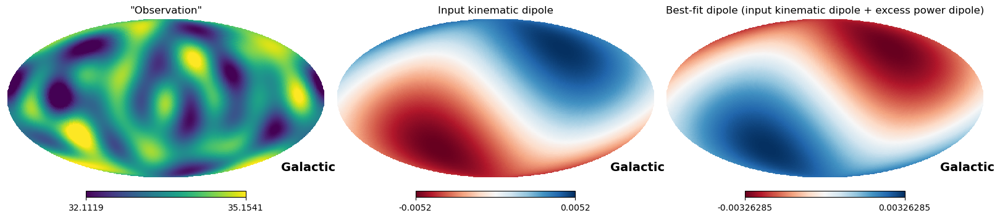

In [36]:
# total dipole?
dipcomps = hp.fit_dipole(observation)[1]
dipamp, dipdir = dipole.get_dipole(dipcomps)
print(f"best-fit dipole is {dipamp:.5f} in {dipdir.galactic}")

# and the input kinematic dipole
cmb_dipdir = SkyCoord(264, 48, unit=u.deg, frame='galactic')
comps = tools.spherical_to_cartesian(r=input_dipamp,
                                    theta=np.pi/2-cmb_dipdir.icrs.dec.rad,
                                    phi=cmb_dipdir.icrs.ra.rad)

# turn these into maps
dmap = dipole.dipole_map([0, *comps])
bestfit_dmap = dipole.dipole_map([0., *dipcomps])

fig = plt.figure(figsize=(16,4))
kwargs = dict(coord=['C','G'])
hp.mollview(data['data'], sub=(1,3,1), title=f'"Observation"', min=np.mean(data['data'])-2*np.std(data['data']),
            max=np.mean(data['data'])+2*np.std(data['data']), **kwargs)
hp.mollview(dmap, sub=(1,3,2), title=f'Input kinematic dipole', min=-input_dipamp, max=input_dipamp, cmap='RdBu', **kwargs)
hp.mollview(bestfit_dmap, sub=(1,3,3), title=f'Best-fit dipole (input kinematic dipole + excess power dipole)', cmap='RdBu', **kwargs)

It makes sense that the dipole amplitude is pushed down towards zero, since in this case the true (i.e. total) dipole in the "data" is actually in the negative CMB dipole direction.

#### Quaia-like: expected dipole + excess power (1e-6.5), _no shot noise_

In [37]:
input_dipamp = 0.0052
input_log_excess = -6.5
base_rate = 33.6330

nmocks = 500
ngens = 14

resdict = np.load(os.path.join(case_dir(input_dipamp, input_log_excess, base_rate, '_no-SN'), f'{nmocks}mocks_{ngens}gens', 'results.npy'),
                  allow_pickle=True).item()
data = resdict['data']  # the data as raw quasar counts
history = resdict['history']  # History object
prior = resdict['prior']  # dictionary
posterior = resdict['posterior']  # pandas dataframe and weights associated with the final posterior
old_posteriors = resdict['old_posteriors']  # posteriors from the other generations

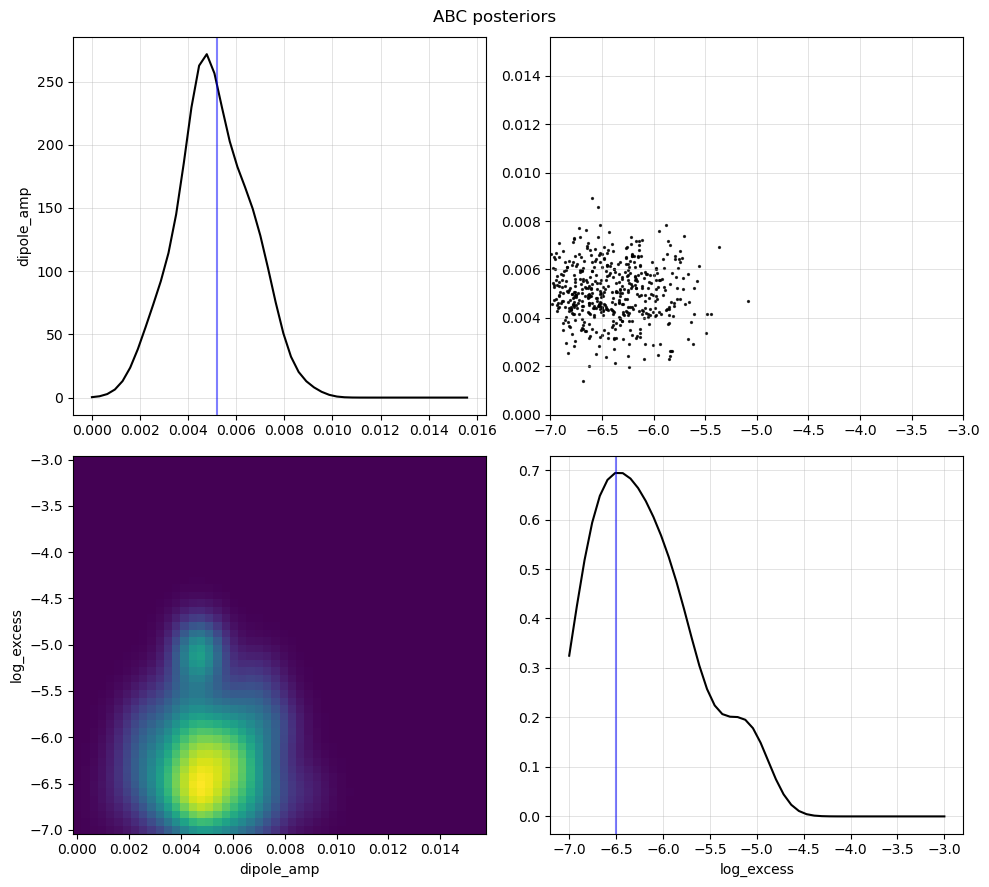

In [38]:
tools.plot_posterior(history, prior, true_dipamp=input_dipamp, true_log_excess=input_log_excess)

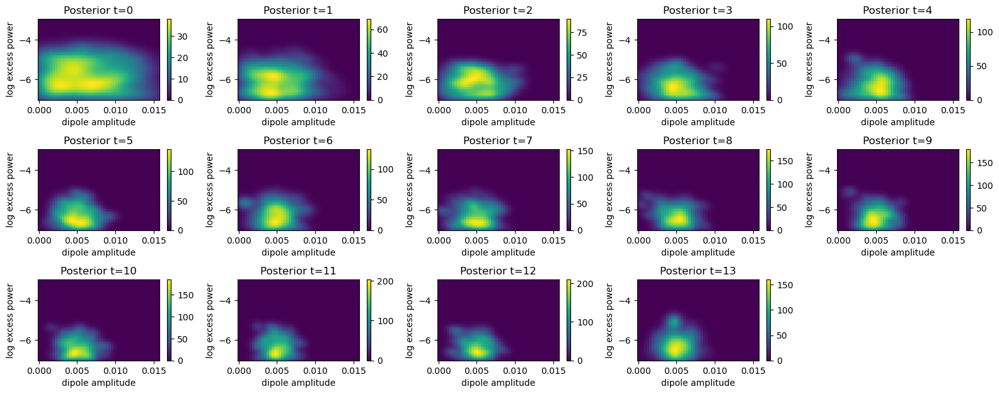

In [41]:
# evolution of the posterior
fig = plt.figure(figsize=(16, 8), tight_layout=True)
for i, (df, w) in enumerate(old_posteriors):
    ax = fig.add_subplot(ngens // 3, 5, i + 1)
    ax = pyabc.visualization.plot_kde_2d(
        df,
        w,
        x="dipole_amp",
        xname=r"dipole amplitude",
        xmin=prior['dipole_amp'][0],
        xmax=prior['dipole_amp'][0] + prior['dipole_amp'][1],
        y="log_excess",
        yname=r"log excess power",
        ymin=prior['log_excess'][0],
        ymax=prior['log_excess'][0] + prior['log_excess'][1],
        ax=ax
    )
    ax.set_title(f"Posterior t={i}")

#### Quaia-like: expected dipole + excess power (1e-6), _no shot noise_

In [43]:
input_dipamp = 0.0052
input_log_excess = -6
base_rate = 33.6330

nmocks = 500
ngens = 14

resdict = np.load(os.path.join(case_dir(input_dipamp, input_log_excess, base_rate, '_no-SN'), f'{nmocks}mocks_{ngens}gens', 'results.npy'),
                  allow_pickle=True).item()
data = resdict['data']  # the data as raw quasar counts
history = resdict['history']  # History object
prior = resdict['prior']  # dictionary
posterior = resdict['posterior']  # pandas dataframe and weights associated with the final posterior
old_posteriors = resdict['old_posteriors']  # posteriors from the other generations

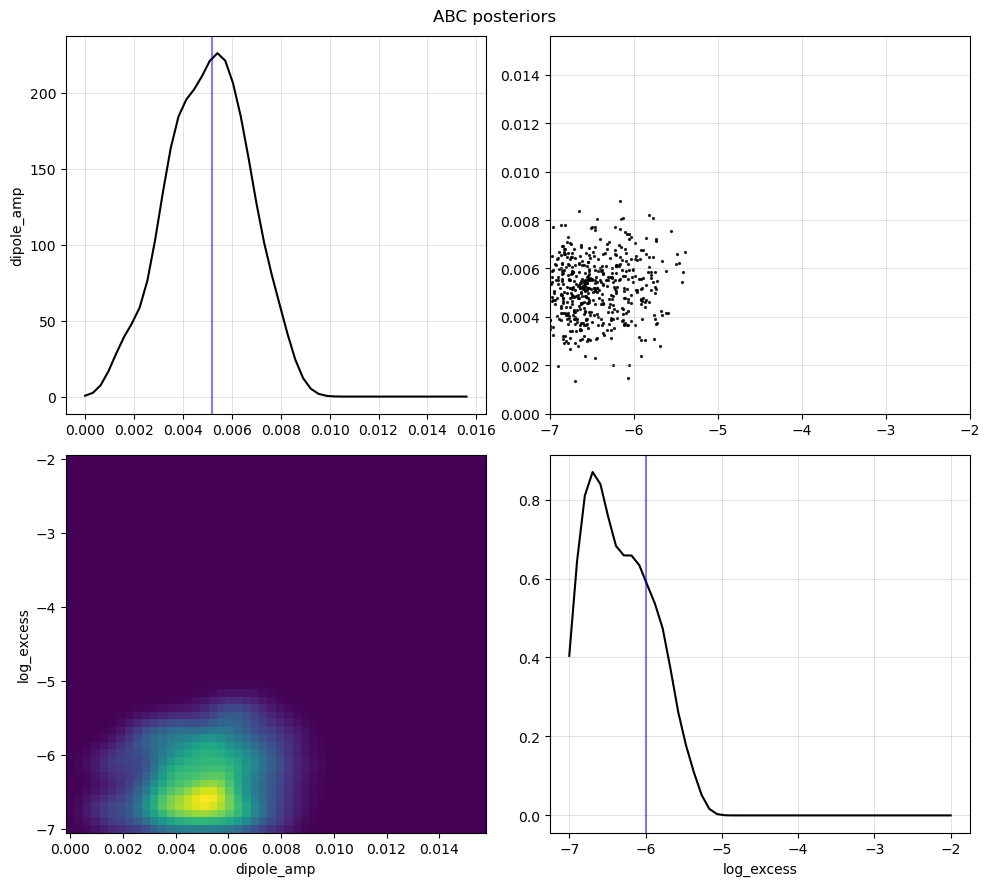

In [44]:
tools.plot_posterior(history, prior, true_dipamp=input_dipamp, true_log_excess=input_log_excess)

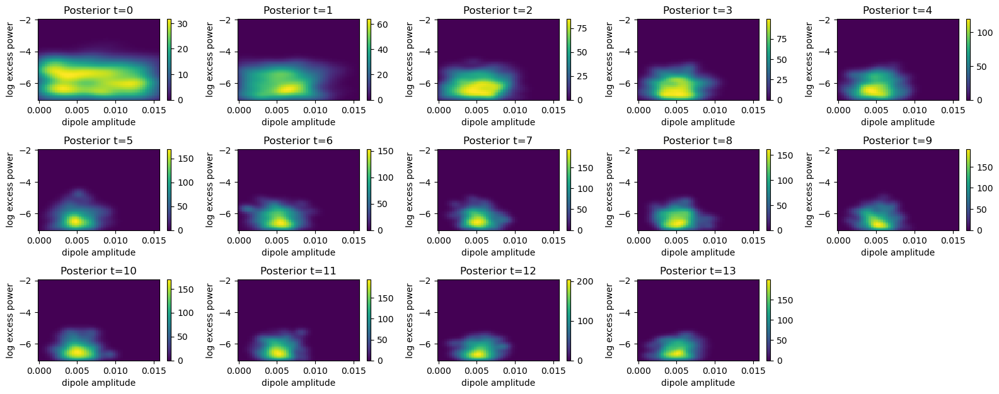

In [48]:
# evolution of the posterior
fig = plt.figure(figsize=(16, 8), tight_layout=True)
for i, (df, w) in enumerate(old_posteriors):
    ax = fig.add_subplot(ngens // 3, 5, i + 1)
    ax = pyabc.visualization.plot_kde_2d(
        df,
        w,
        x="dipole_amp",
        xname=r"dipole amplitude",
        xmin=prior['dipole_amp'][0],
        xmax=prior['dipole_amp'][0] + prior['dipole_amp'][1],
        y="log_excess",
        yname=r"log excess power",
        ymin=prior['log_excess'][0],
        ymax=prior['log_excess'][0] + prior['log_excess'][1],
        ax=ax
    )
    ax.set_title(f"Posterior t={i}")

#### Quaia-like: expected dipole + excess power (1e-4), _no shot noise_

In [30]:
input_dipamp = 0.0052
input_log_excess = -4
base_rate = 33.6330

nmocks = 500
ngens = 10

resdict = np.load(os.path.join(case_dir(input_dipamp, input_log_excess, base_rate, '_no-SN'), f'{nmocks}mocks_{ngens}gens', 'results.npy'),
                  allow_pickle=True).item()
data = resdict['data']  # the data as raw quasar counts
history = resdict['history']  # History object
prior = resdict['prior']  # dictionary
posterior = resdict['posterior']  # pandas dataframe and weights associated with the final posterior
old_posteriors = resdict['old_posteriors']  # posteriors from the other generations

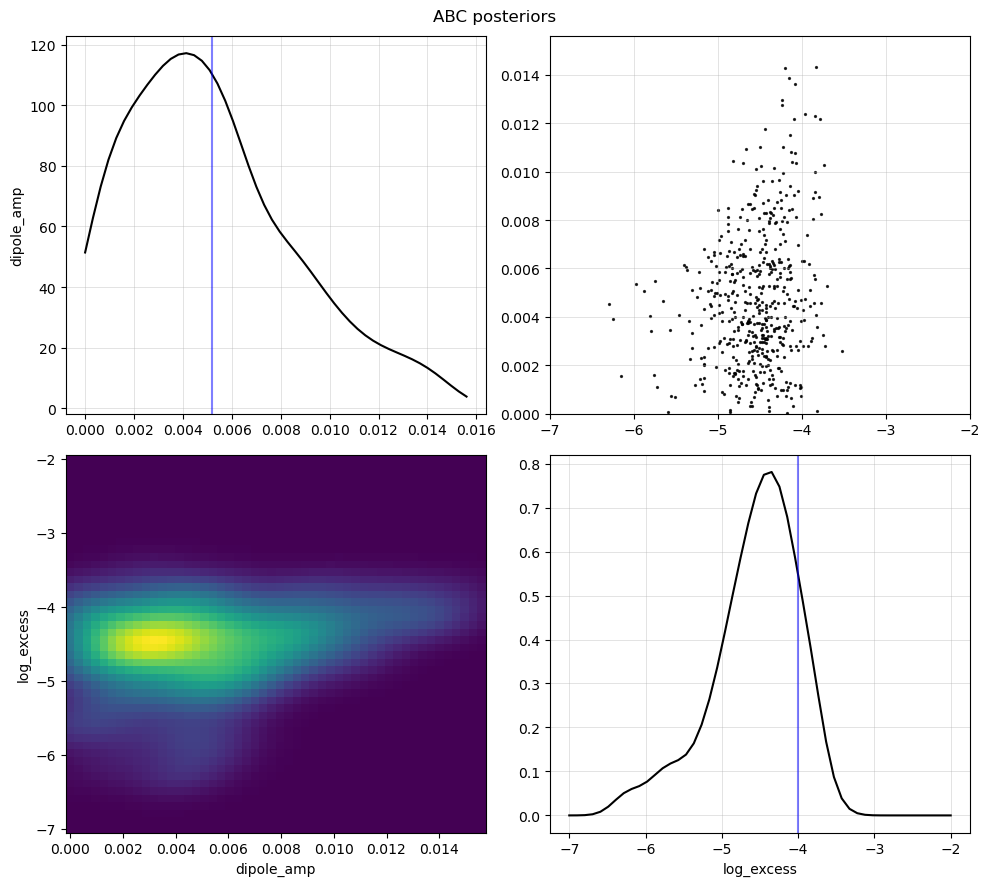

In [31]:
tools.plot_posterior(history, prior, true_dipamp=input_dipamp, true_log_excess=input_log_excess)

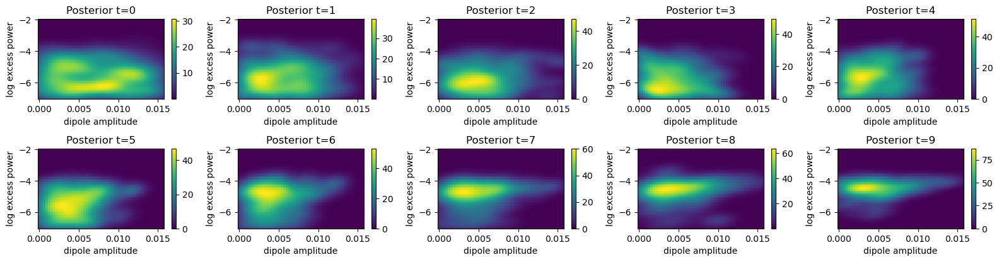

In [33]:
# evolution of the posterior
fig = plt.figure(figsize=(16, 10), tight_layout=True)
for i, (df, w) in enumerate(old_posteriors):
    ax = fig.add_subplot(ngens // 2, 5, i + 1)
    ax = pyabc.visualization.plot_kde_2d(
        df,
        w,
        x="dipole_amp",
        xname=r"dipole amplitude",
        xmin=prior['dipole_amp'][0],
        xmax=prior['dipole_amp'][0] + prior['dipole_amp'][1],
        y="log_excess",
        yname=r"log excess power",
        ymin=prior['log_excess'][0],
        ymax=prior['log_excess'][0] + prior['log_excess'][1],
        ax=ax
    )
    ax.set_title(f"Posterior t={i}")

#### Quaia-like: expected dipole + excess power (1e-5), _no shot noise_, _**antiparallel** excess dipole_

In [24]:
input_dipamp = 0.0052
input_log_excess = -5
base_rate = 33.6330

nmocks = 500
ngens = 12

resdict = np.load(os.path.join(case_dir(input_dipamp, input_log_excess, base_rate, '_no-SN_antipar-dipole'),
                               f'{nmocks}mocks_{ngens}gens', 'results.npy'),
                  allow_pickle=True).item()
data = resdict['data']  # the data as raw quasar counts
observation = resdict['observation']  # the data as overdensity
history = resdict['history']  # History object
prior = resdict['prior']  # dictionary
posterior = resdict['posterior']  # pandas dataframe and weights associated with the final posterior
old_posteriors = resdict['old_posteriors']  # posteriors from the other generations

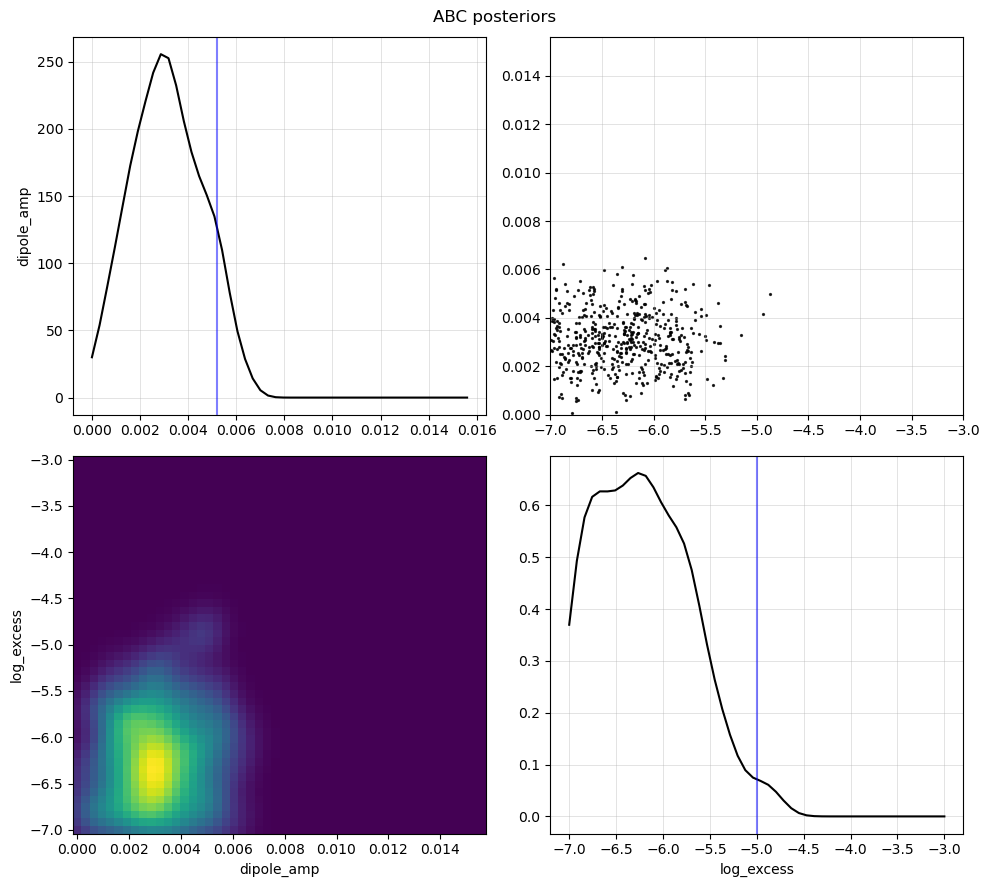

In [25]:
tools.plot_posterior(history, prior, true_dipamp=input_dipamp, true_log_excess=input_log_excess)

In [26]:
# what is the total dipole in this (i.e. including the "excess power dipole")?
print(input_dipamp, tools.D_from_C1(10**input_log_excess), tools.C1_from_D(input_dipamp))
input_dipamp - tools.D_from_C1(10**input_log_excess)  # this is what the total dipole should be in the "observation"

0.0052 0.002676186174229157 3.7754962379141335e-05


0.002523813825770843

best-fit dipole is 0.00252 in <SkyCoord (Galactic): (l, b) in deg
    (263.99656769, 48.00129784)>


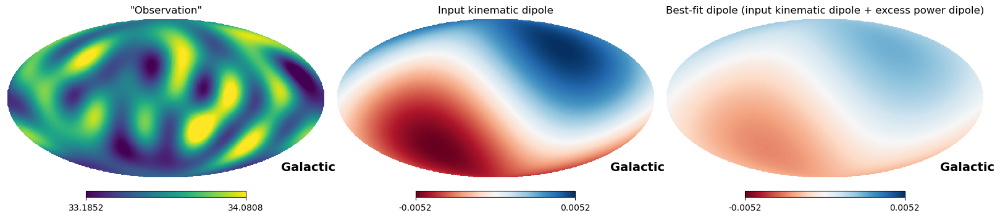

In [31]:
# okay but what is the total dipole in this (i.e. including the "excess power dipole")
dipcomps = hp.fit_dipole(observation)[1]
dipamp, dipdir = dipole.get_dipole(dipcomps)
print(f"best-fit dipole is {dipamp:.5f} in {dipdir.galactic}")

# and the input kinematic dipole
cmb_dipdir = SkyCoord(264, 48, unit=u.deg, frame='galactic')
comps = tools.spherical_to_cartesian(r=input_dipamp,
                                    theta=np.pi/2-cmb_dipdir.icrs.dec.rad,
                                    phi=cmb_dipdir.icrs.ra.rad)

# turn these into maps
dmap = dipole.dipole_map([0, *comps])
bestfit_dmap = dipole.dipole_map([0., *dipcomps])

fig = plt.figure(figsize=(16,4))
kwargs = dict(coord=['C','G'])
hp.mollview(data['data'], sub=(1,3,1), title=f'"Observation"', min=np.mean(data['data'])-2*np.std(data['data']),
            max=np.mean(data['data'])+2*np.std(data['data']), **kwargs)
hp.mollview(dmap, sub=(1,3,2), title=f'Input kinematic dipole', min=-input_dipamp, max=input_dipamp, cmap='RdBu', **kwargs)
hp.mollview(bestfit_dmap, sub=(1,3,3), title=f'Best-fit dipole (input kinematic dipole + excess power dipole)',
            min=-input_dipamp, max=input_dipamp, cmap='RdBu', **kwargs)

In [29]:
# mean posterior dipole amp?
np.mean(posterior[0]['dipole_amp'])

0.003115233971655526

In [30]:
# why is the excess power posterior so low??

#### Quaia-like: expected dipole +  excess power (1e-4)

In [12]:
input_dipamp = 0.0052
input_log_excess = -4
base_rate = 33.6330

In [13]:
nmocks = 500
ngens = 15

resdict = np.load(os.path.join(case_dir(input_dipamp, input_log_excess, base_rate), f'{nmocks}mocks_{ngens}gens', 'results.npy'),
                  allow_pickle=True).item()
data = resdict['data']  # the data as raw quasar counts
history = resdict['history']  # History object
prior = resdict['prior']  # dictionary
observation = resdict['observation']  # the data as overdensity
posterior = resdict['posterior']  # pandas dataframe and weights associated with the final posterior
old_posteriors = resdict['old_posteriors']  # posteriors from the otehr generations

In [14]:
prior

{'dipole_amp': (0.0, 0.0156), 'log_excess': (-7, 4)}

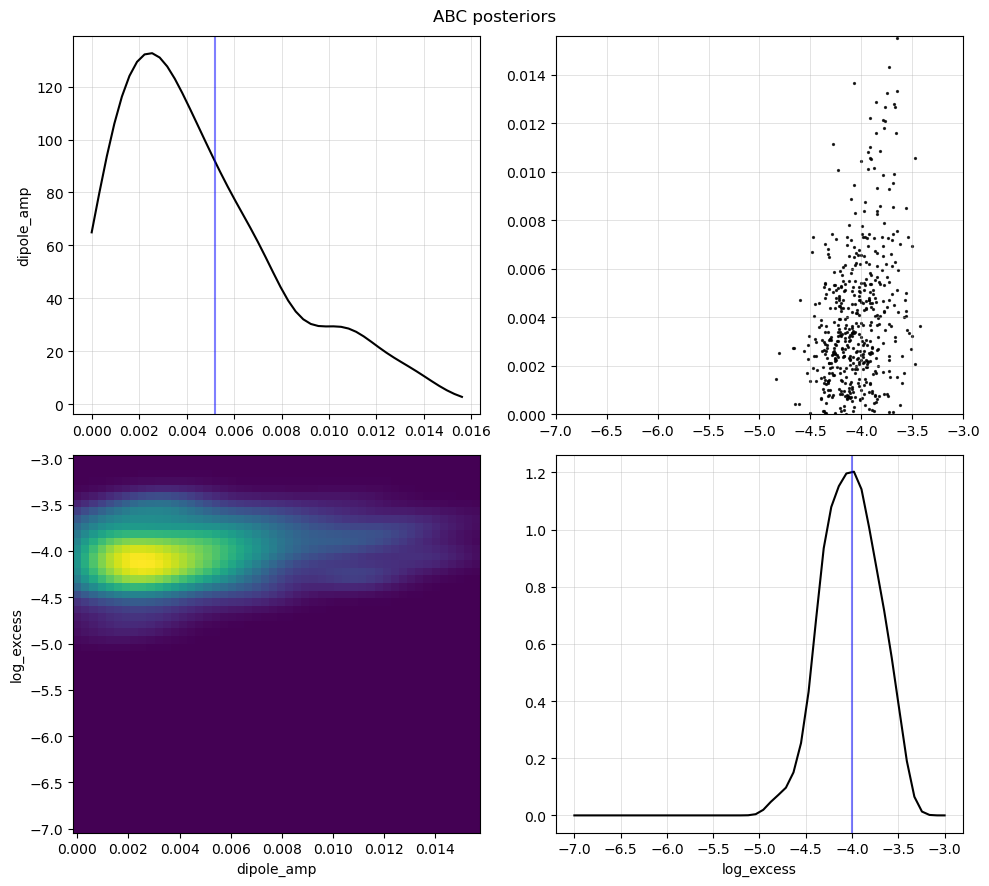

In [7]:
tools.plot_posterior(history, prior, true_dipamp=input_dipamp, true_log_excess=input_log_excess)

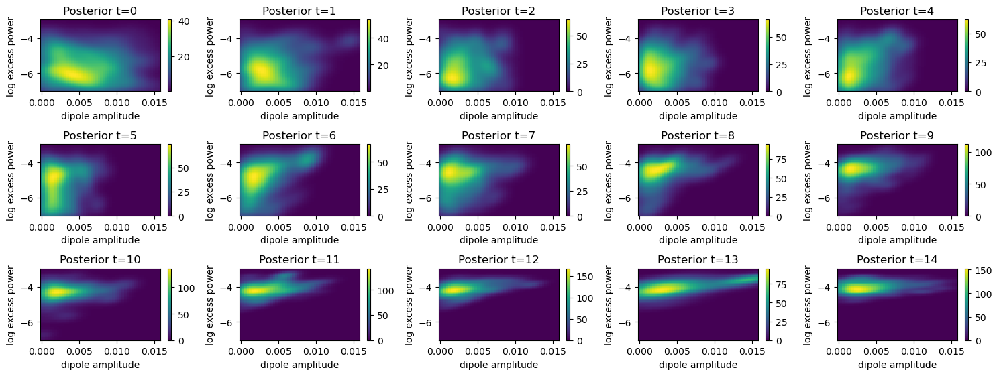

In [8]:
# evolution of the posterior
fig = plt.figure(figsize=(15, 9), tight_layout=True)
for i, (df, w) in enumerate(old_posteriors):
    ax = fig.add_subplot(ngens // 3, 5, i + 1)
    ax = pyabc.visualization.plot_kde_2d(
        df,
        w,
        x="dipole_amp",
        xname=r"dipole amplitude",
        xmin=prior['dipole_amp'][0],
        xmax=prior['dipole_amp'][0] + prior['dipole_amp'][1],
        y="log_excess",
        yname=r"log excess power",
        ymin=prior['log_excess'][0],
        ymax=prior['log_excess'][0] + prior['log_excess'][1],
        ax=ax
    )
    ax.set_title(f"Posterior t={i}")

In [9]:
# smooth the "true" data / observation
smoothed_datamap = tools.smooth_map(data['data'])
# smoothed_odmap = tools.smooth_map(observation)

/ext3/miniconda3/lib/python3.10/site-packages/healpy/visufunc.py:332: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  pylab.draw()
/ext3/miniconda3/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


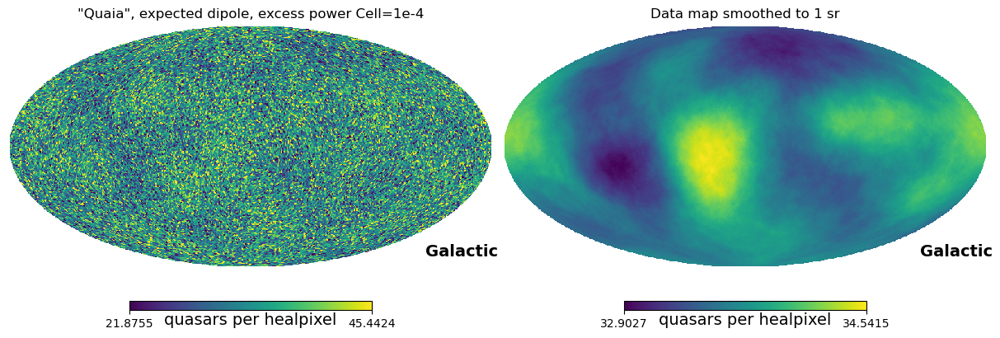

In [10]:
# input map
fig = plt.figure(figsize=(12,8), tight_layout=True)
mean, std = np.nanmean(resdict['data']['data']), np.nanstd(resdict['data']['data'])
kwargs = dict(coord=['C','G'], unit='quasars per healpixel', cmap='viridis')
hp.mollview(data['data'], title='"Quaia", expected dipole, excess power Cell='f'1e{input_log_excess}',
            sub=(1,2,1), min=mean-2*std, max=mean+2*std, **kwargs)
hp.mollview(smoothed_datamap, title='Data map smoothed to 1 sr', sub=(1,2,2), **kwargs)
# kwargs = dict(coord=['C','G'], unit='overdensity', cmap='RdBu')
# hp.mollview(observation, title='Overdensity', sub=(2,2,2), min=-0.5, max=0.5, **kwargs)
# hp.mollview(smoothed_odmap, title='Overdensity smoothed to 1 sr', sub=(2,2,4), min=-.03, max=.03, **kwargs)

In [9]:
# get the mean of the posterior and prior samples

# posterior
posterior_dir = os.path.join(case_dir(input_dipamp, input_log_excess, base_rate), f'{nmocks}mocks_{ngens}gens', 'accepted_samples')
mean_posterior = np.zeros_like(data['data']).astype(float)
for i in range(nmocks):
    mean_posterior += np.load(os.path.join(posterior_dir, f'mock{i}.npy'))
mean_posterior /= nmocks  # divide by number of samples to get the mean

In [21]:
# smooth the mean posterior
mean_posterior_smoothed = tools.smooth_map(mean_posterior)

In [10]:
# prior
prior_dir = os.path.join(case_dir(input_dipamp, input_log_excess, base_rate), f'{nmocks}mocks_{ngens}gens', 'prior_samples')
mean_prior = np.zeros_like(data['data']).astype(float)
for i in range(nmocks):
    mean_prior += np.load(os.path.join(prior_dir, f'mock{i}.npy'))
mean_prior /= nmocks  # divide by number of samples to get the mean

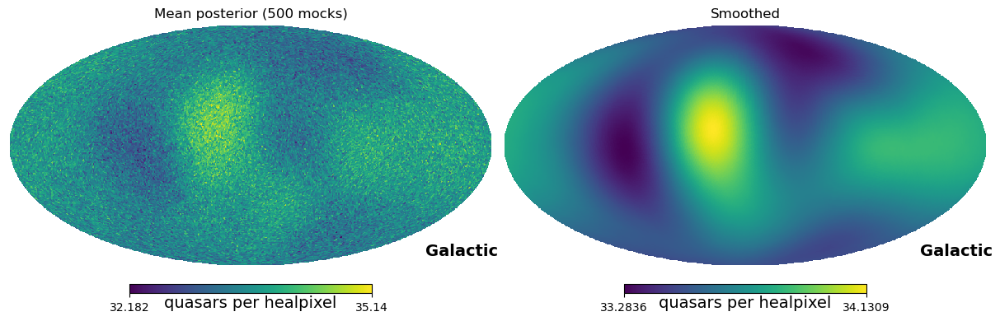

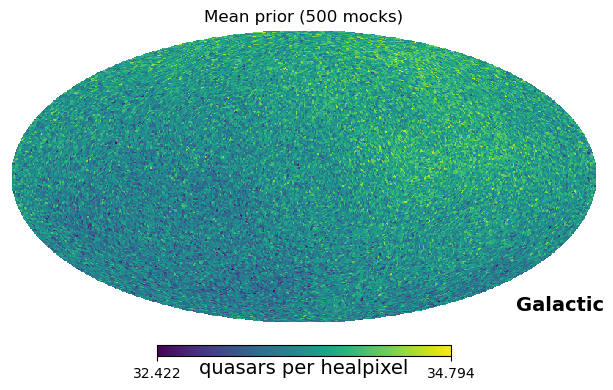

In [26]:
fig = plt.figure(figsize=(12,4), tight_layout=True)
kwargs = dict(coord=['C','G'], cmap='viridis', unit='quasars per healpixel', fig=fig)
hp.mollview(mean_posterior, sub=(1,2,1), title=f'Mean posterior ({nmocks} mocks)', **kwargs)
hp.mollview(mean_posterior_smoothed, sub=(1,2,2), title=f'Smoothed', **kwargs)

fig = plt.figure(figsize=(12,4), tight_layout=True)
kwargs = dict(coord=['C','G'], cmap='viridis', unit='quasars per healpixel', fig=fig)
hp.mollview(mean_prior, sub=(1,2,1), title=f'Mean prior ({nmocks} mocks)', **kwargs)
# hp.mollview(mean_prior_smoothed, sub=(1,2,2), title=f'Smoothed')

In [11]:
# measure Cells
Lambda = 0.
selfunc = np.ones(hp.nside2npix(nside))

# on the "data"
odmap = dipole.overdensity_map(data['data'], selfunc)
ells, Cells_data, alms_data = multipoles.compute_Cells_in_overdensity_map_Lambda(odmap,
                                                                Lambda=Lambda,
                                                                max_ell=8, # magic
                                                                selfunc=selfunc,
                                                                return_alms=True)

In [13]:
# on the mean posterior
odmap = dipole.overdensity_map(mean_posterior, selfunc)
print(mean_posterior.shape, selfunc.shape, type(mean_posterior), type(selfunc), mean_posterior.dtype, selfunc.dtype)
ells, Cells_post, alms_post = multipoles.compute_Cells_in_overdensity_map_Lambda(odmap,
                                                                Lambda=Lambda,
                                                                max_ell=8, # magic
                                                                selfunc=selfunc,
                                                                return_alms=True)

(49152,) (49152,) <class 'numpy.ndarray'> <class 'numpy.ndarray'> float64 float64


In [14]:
odmap.shape, type(odmap), odmap.dtype

((49152,), numpy.ndarray, dtype('float64'))

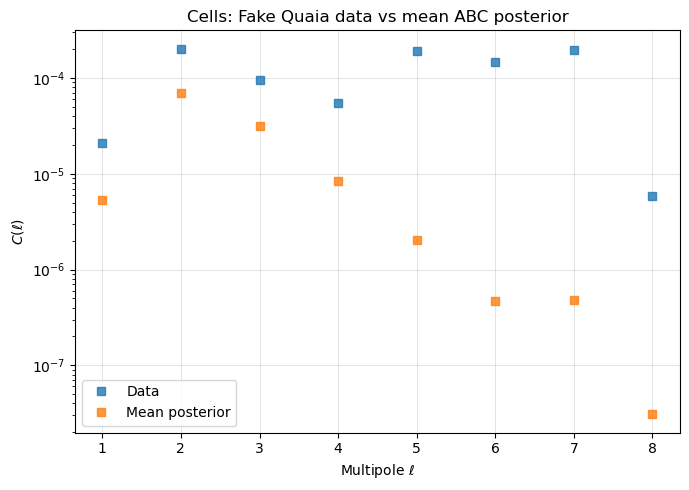

In [37]:
fig, ax = plt.subplots(figsize=(7,5), tight_layout=True)

kwargs = dict(marker='s', alpha=0.8, ls='None')
ax.plot(ells[1:], Cells_data[1:], label='Data', **kwargs)
ax.plot(ells[1:], Cells_post[1:], label='Mean posterior', **kwargs)
ax.grid(alpha=0.5, lw=0.5)
ax.set_xlabel('Multipole $\ell$')
ax.set_ylabel(r'$C(\ell)$')
ax.set_title('Cells: Fake Quaia data vs mean ABC posterior')
ax.semilogy()
ax.legend()

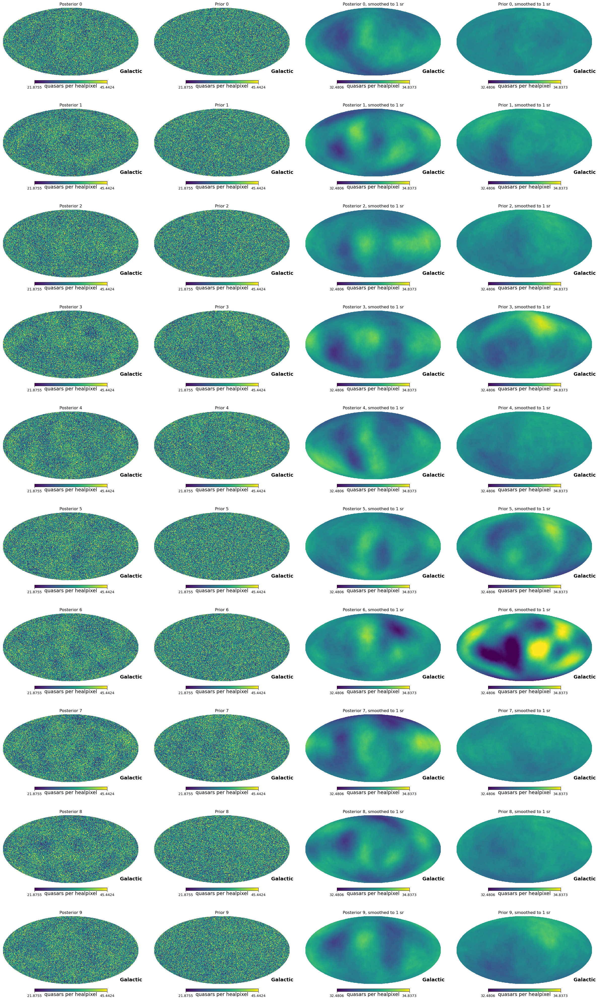

In [17]:
# load some posterior and prior samples and smoothed versions
posterior_dir = os.path.join(case_dir(input_dipamp, input_log_excess, base_rate), f'{nmocks}mocks_{ngens}gens', 'accepted_samples')
prior_dir = os.path.join(case_dir(input_dipamp, input_log_excess, base_rate), f'{nmocks}mocks_{ngens}gens', 'prior_samples')

n = 10
fig = plt.figure(figsize=(24, 4 * n), tight_layout=True)
kwargs = dict(coord=['C','G'], cmap='viridis', unit='quasars per healpixel', fig=fig)
vmin, vmax = mean-2*std, mean+2*std
vmin_sm, vmax_sm = mean-0.2*std, mean+0.2*std
for i in range(n):
    # load posterior mock
    post_mock = np.load(os.path.join(posterior_dir, f'mock{i}.npy'))
    post_mock_smoothed = np.load(os.path.join(posterior_dir, f'mock{i}_smoothed.npy'))
    # load prior mock
    prior_mock = np.load(os.path.join(prior_dir, f'mock{i}.npy'))
    prior_mock_smoothed = np.load(os.path.join(prior_dir, f'mock{i}_smoothed.npy'))
    hp.mollview(post_mock, sub=(n, 4, 4*i+1), title=f'Posterior {i}', min=vmin, max=vmax, **kwargs)
    hp.mollview(prior_mock, sub=(n, 4, 4*i+2), title=f'Prior {i}', min=vmin, max=vmax, **kwargs)
    hp.mollview(post_mock_smoothed, sub=(n, 4, 4*i+3), title=f'Posterior {i}, smoothed to 1 sr', min=vmin_sm, max=vmax_sm, **kwargs)
    hp.mollview(prior_mock_smoothed, sub=(n, 4, 4*i+4), title=f'Prior {i}, smoothed to 1 sr', min=vmin_sm, max=vmax_sm, **kwargs)

#### Quaia-like: expected dipole +  excess power (1e-6)

In [18]:
input_dipamp = 0.0052
input_log_excess = -6
base_rate = 33.6330

In [19]:
nmocks = 500
ngens = 15

resdict = np.load(os.path.join(case_dir(input_dipamp, input_log_excess, base_rate), f'{nmocks}mocks_{ngens}gens', 'results.npy'),
                  allow_pickle=True).item()
data = resdict['data']  # the data as raw quasar counts
history = resdict['history']  # History object
prior = resdict['prior']  # dictionary
observation = resdict['observation']  # the data as overdensity
posterior = resdict['posterior']  # pandas dataframe and weights associated with the final posterior
old_posteriors = resdict['old_posteriors']  # posteriors from the otehr generations

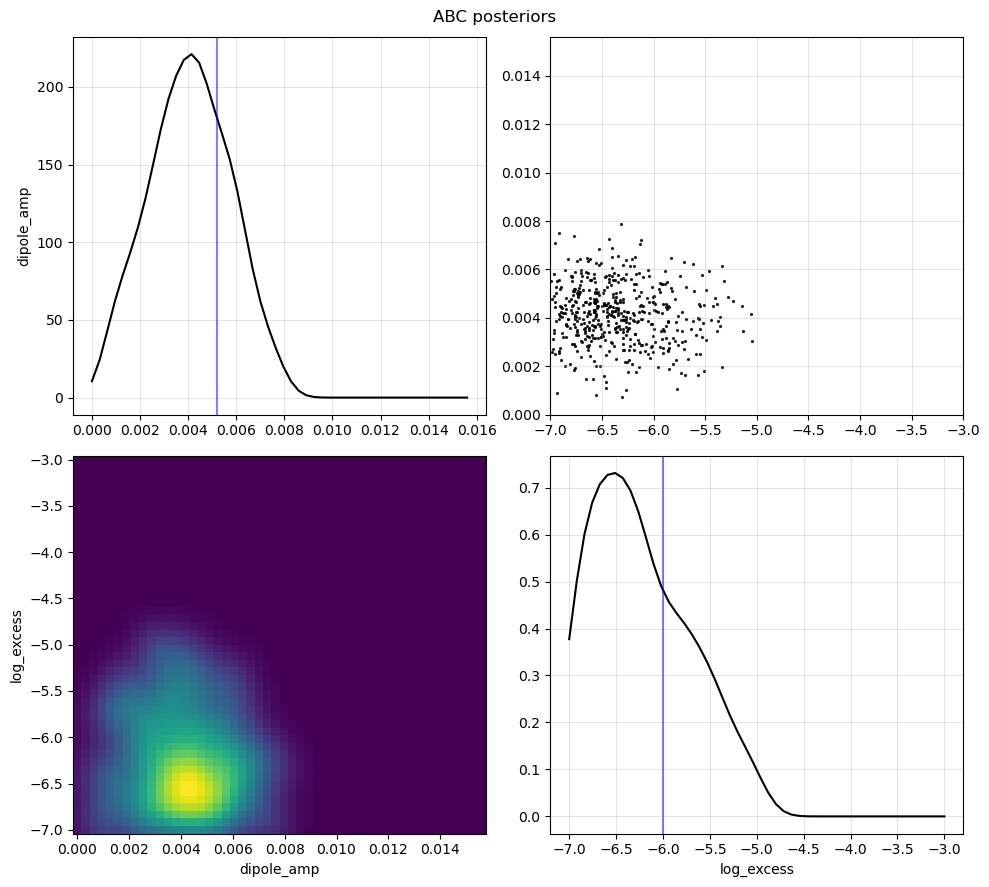

In [20]:
tools.plot_posterior(history, prior, true_dipamp=input_dipamp, true_log_excess=input_log_excess)

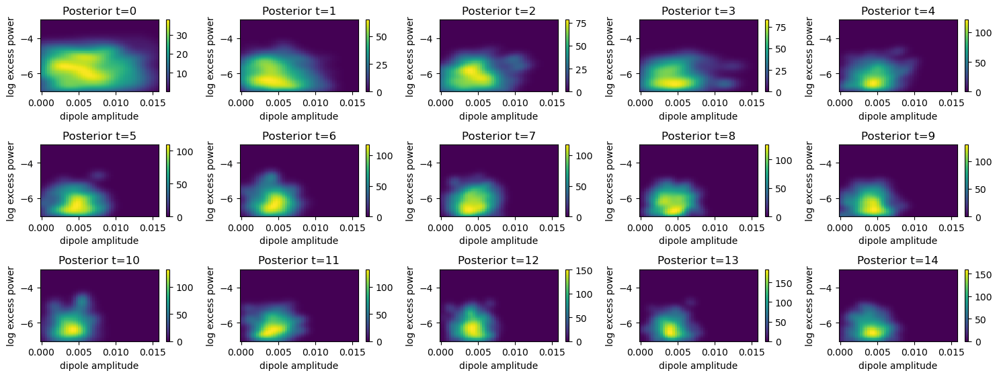

In [21]:
# evolution of the posterior
fig = plt.figure(figsize=(15, 9), tight_layout=True)
for i, (df, w) in enumerate(resdict['old_posteriors']):
    ax = fig.add_subplot(ngens // 3, 5, i + 1)
    ax = pyabc.visualization.plot_kde_2d(
        df,
        w,
        x="dipole_amp",
        xname=r"dipole amplitude",
        xmin=prior['dipole_amp'][0],
        xmax=prior['dipole_amp'][0] + prior['dipole_amp'][1],
        y="log_excess",
        yname=r"log excess power",
        ymin=prior['log_excess'][0],
        ymax=prior['log_excess'][0] + prior['log_excess'][1],
        ax=ax
    )
    ax.set_title(f"Posterior t={i}")

### fake ("more ideal") data (done here before getting results above)

In [3]:
nside = 64

In [4]:
# expected dipole direction
cmb_dipdir = SkyCoord(264, 48, unit=u.deg, frame='galactic')

# (theta, phi) in each healpixel
theta, phi = hp.pix2ang(nside, ipix=np.arange(hp.nside2npix(nside)))

#### ideal case: NO shot noise, perfect completeness, expected dipole, zero excess power

In [5]:
selfunc = np.ones(hp.nside2npix(nside))
base_rate = 33.6330  # mean base rate of the final 100 accepted samples for Quaia, 14 generations
expected_dipole_amp = 0.0052
data_pars = dict(dipole_amp=expected_dipole_amp, log_excess=-30)
    # I did a hacky thing where if the input log_excess < -20, it gets set to exactly zero
ell_max = 8

ideal_data = model(data_pars, selfunc, base_rate, cmb_dipdir, theta, phi, ell_max, poisson=False)
smoothed_ideal_data = tools.smooth_map(ideal_data['data'], verbose=True)

/ext3/miniconda3/lib/python3.10/site-packages/healpy/visufunc.py:332: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  pylab.draw()
/ext3/miniconda3/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


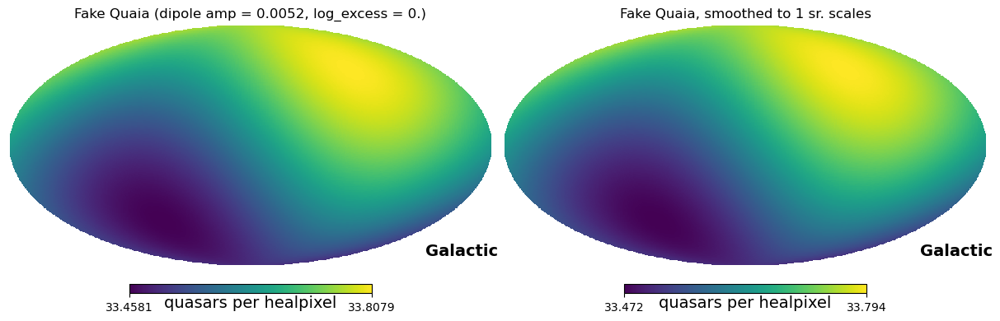

In [6]:
fig = plt.figure(figsize=(12,4), tight_layout=True)
kwargs = dict(coord=['C','G'], unit='quasars per healpixel', cmap='viridis', fig=fig)
hp.mollview(ideal_data['data'], title=f"Fake Quaia (dipole amp = {data_pars['dipole_amp']}, log_excess = 0.)",
            sub=(1,2,1), **kwargs)
hp.mollview(smoothed_ideal_data, title=f"Fake Quaia, smoothed to 1 sr. scales", sub=(1,2,2), **kwargs)

In [9]:
# overdensity
odmap = ideal_data['data'] / np.nanmean(ideal_data['data']) - 1.

In [15]:
# run the sampling
population_size = 50
minimum_epsilon = 1e-8
max_nr_populations = 10

# define wrappers for this case
def model_wrapper(parameters):  
    return model(parameters, selfunc, base_rate, cmb_dipdir, theta, phi, ell_max, poisson=False)

def distance_wrapper(x, x0):
        return distance(x, x0, 1)  # nside 1

# prior
dipole_amp_bounds = (0., 3 * expected_dipole_amp) # first is lower bound, second entry is WIDTH (not upper bound)
log_excess_bounds = (-30, 10)
prior = pyabc.Distribution(dipole_amp = pyabc.RV("uniform", *dipole_amp_bounds),
                           log_excess = pyabc.RV("uniform", *log_excess_bounds))

abc = pyabc.ABCSMC(model_wrapper, prior, distance_wrapper, population_size=population_size)
observation = odmap

# store the history at this tempfile
db_path = os.path.join(tempfile.gettempdir(), f'history_fakemaps.db')
abc.new("sqlite:///" + db_path, {"data": observation})

history = abc.run(minimum_epsilon=minimum_epsilon, max_nr_populations=max_nr_populations)

ABC.Sampler INFO: Parallelize sampling on 48 processes.
ABC.History INFO: Start <ABCSMC id=3, start_time=2025-01-14 17:16:08>
ABC INFO: Calibration sample t = -1.
ABC INFO: t: 0, eps: 4.65386624e-05.
ABC INFO: Accepted: 50 / 112 = 4.4643e-01, ESS: 5.0000e+01.
ABC INFO: t: 1, eps: 1.09468914e-05.
ABC INFO: Accepted: 50 / 99 = 5.0505e-01, ESS: 4.8199e+01.
ABC INFO: t: 2, eps: 2.90946926e-06.
ABC INFO: Accepted: 50 / 119 = 4.2017e-01, ESS: 4.5619e+01.
ABC INFO: t: 3, eps: 9.45048527e-07.
ABC INFO: Accepted: 50 / 109 = 4.5872e-01, ESS: 4.4569e+01.
ABC INFO: t: 4, eps: 2.06323536e-07.
ABC INFO: Accepted: 50 / 130 = 3.8462e-01, ESS: 4.4301e+01.
ABC INFO: t: 5, eps: 3.12886073e-08.
ABC INFO: Accepted: 50 / 121 = 4.1322e-01, ESS: 4.7965e+01.
ABC INFO: t: 6, eps: 9.86879065e-09.
ABC INFO: Accepted: 50 / 119 = 4.2017e-01, ESS: 4.7777e+01.
ABC INFO: Stop: Minimum epsilon.
ABC.History INFO: Done <ABCSMC id=3, duration=0:00:18.830020, end_time=2025-01-14 17:16:26>


Text(0.5, 0.98, 'Fake Quaia ABC posteriors, nside=64, 7 generations')

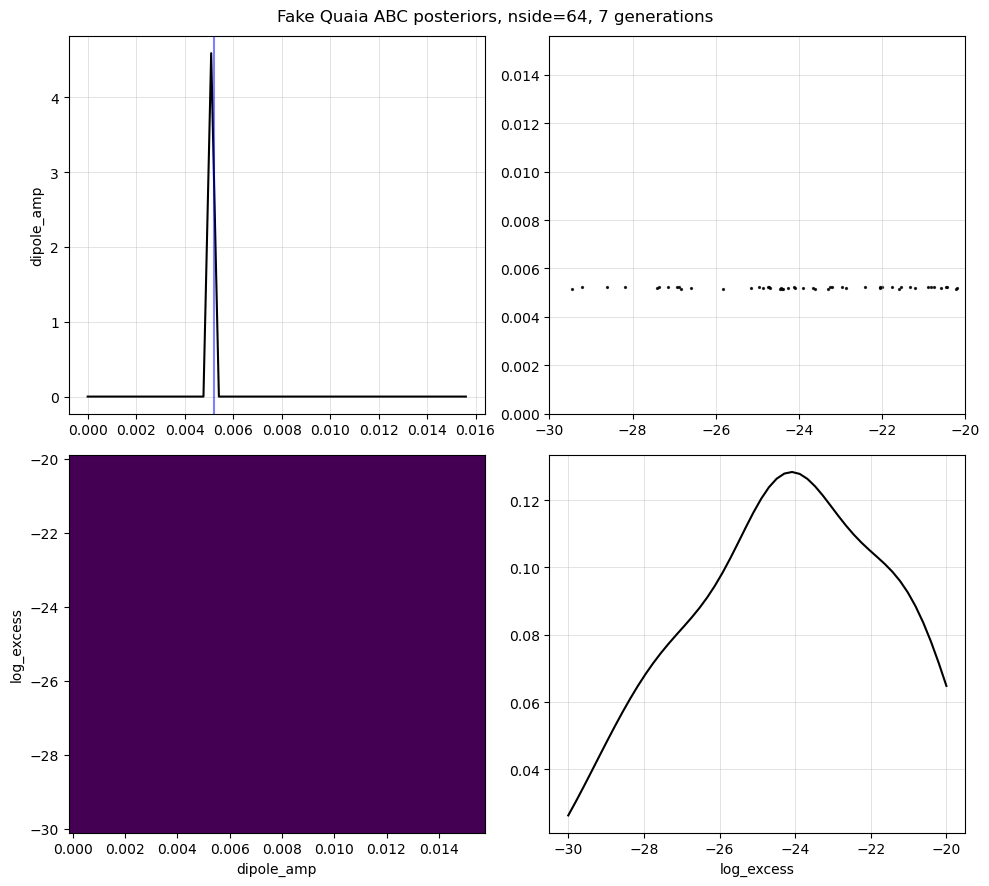

In [20]:
# posterior
prior_dict = dict(dipole_amp=dipole_amp_bounds, log_excess=log_excess_bounds)
par_ids = [x for x in prior_dict.keys()]
fig, axs = plt.subplots(len(par_ids), len(par_ids), figsize=(10,9), tight_layout=True)
df, w = history.get_distribution()

for i in range(len(par_ids)):

    # diagonal
    ax = axs[i, i]
    x, pdf = tools.get_kde_1d(history, prior_dict, par_ids[i])
    ax.plot(x, pdf, c='k')
    ax.grid(alpha=0.5, lw=0.5)
    if i == 0:
        ax.axvline(0.0052, c='b', alpha=0.5)

    axs[i,0].set_ylabel(par_ids[i])
    axs[len(par_ids)-1,i].set_xlabel(par_ids[i])

    for j in range(0, i):

        # lower
        ax = axs[i, j]
        x, y, pdf = tools.get_kde_2d(history, prior_dict, par_ids[j], par_ids[i])
        mesh = ax.pcolormesh(x, y, pdf, shading='auto')

        # upper
        ax = axs[j, i]
        tools.scatter(history, prior_dict, par_ids[i], par_ids[j], ax, color='k', alpha=0.8, marker='.', s=7)
        ax.grid(alpha=0.5, lw=0.5)
        
fig.suptitle(f'Fake Quaia ABC posteriors, nside={nside}, {history.max_t +1} generations')

In [22]:
np.mean(df['dipole_amp']) # dipole amp recovered really well; log_excess is weird but we also input zero

0.005206696351433643

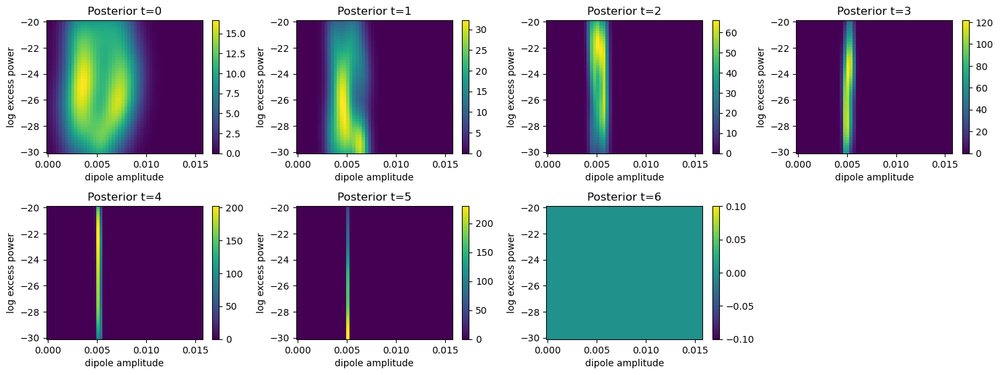

In [29]:
# evolution of the posterior
fig = plt.figure(figsize=(15, 8), tight_layout=True)
for t in range(history.max_t + 1):
    ax = fig.add_subplot((history.max_t + 1) // 2, 4, t + 1)
    df, w = history.get_distribution(t=t)
    ax = pyabc.visualization.plot_kde_2d(
        df,
        w,
        x="dipole_amp",
        xname=r"dipole amplitude",
        xmin=prior_dict['dipole_amp'][0],
        xmax=prior_dict['dipole_amp'][0] + prior_dict['dipole_amp'][1],
        y="log_excess",
        yname=r"log excess power",
        ymin=prior_dict['log_excess'][0],
        ymax=prior_dict['log_excess'][0] + prior_dict['log_excess'][1],
        ax=ax
    )
    ax.set_title(f"Posterior t={t}")

#### shot noise, perfect completeness, expected dipole, zero excess power

In [23]:
selfunc = np.ones(hp.nside2npix(nside))
base_rate = 33.6330  # mean base rate of the final 100 accepted samples for Quaia, 14 generations
expected_dipole_amp = 0.0052
data_pars = dict(dipole_amp=expected_dipole_amp, log_excess=-30)
ell_max = 8

data = model(data_pars, selfunc, base_rate, cmb_dipdir, theta, phi, ell_max, poisson=True)
smoothed_data = tools.smooth_map(data['data'], verbose=True)

/ext3/miniconda3/lib/python3.10/site-packages/healpy/visufunc.py:332: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  pylab.draw()
/ext3/miniconda3/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


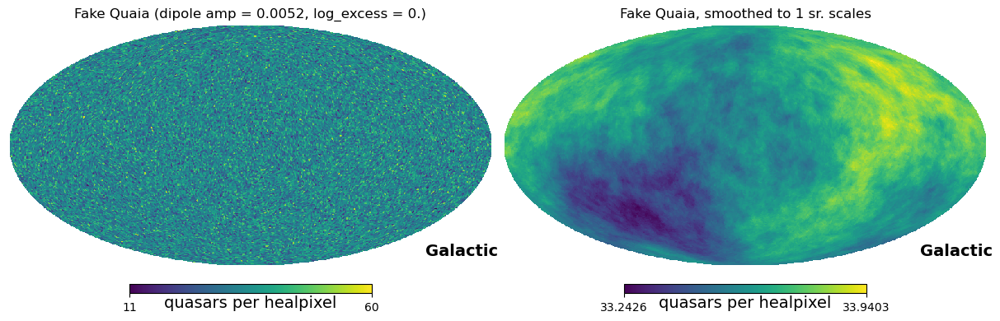

In [24]:
fig = plt.figure(figsize=(12,4), tight_layout=True)
kwargs = dict(coord=['C','G'], unit='quasars per healpixel', cmap='viridis', fig=fig)
hp.mollview(data['data'], title=f"Fake Quaia (dipole amp = {data_pars['dipole_amp']}, log_excess = 0.)",
            sub=(1,2,1), **kwargs)
hp.mollview(smoothed_data, title=f"Fake Quaia, smoothed to 1 sr. scales", sub=(1,2,2), **kwargs)

In [30]:
# overdensity
odmap = data['data'] / np.nanmean(data['data']) - 1.

In [31]:
# run the sampling
population_size = 50
minimum_epsilon = 1e-8
max_nr_populations = 10

# define wrappers for this case
def model_wrapper(parameters):  
    return model(parameters, selfunc, base_rate, cmb_dipdir, theta, phi, ell_max, poisson=True)

def distance_wrapper(x, x0):
        return distance(x, x0, 1)  # nside 1

# prior
dipole_amp_bounds = (0., 3 * expected_dipole_amp) # first is lower bound, second entry is WIDTH (not upper bound)
log_excess_bounds = (-30, 10)
prior = pyabc.Distribution(dipole_amp = pyabc.RV("uniform", *dipole_amp_bounds),
                           log_excess = pyabc.RV("uniform", *log_excess_bounds))

abc = pyabc.ABCSMC(model_wrapper, prior, distance_wrapper, population_size=population_size)
observation = odmap

# store the history at this tempfile
db_path = os.path.join(tempfile.gettempdir(), f'history_fakemaps.db')
abc.new("sqlite:///" + db_path, {"data": observation})

history = abc.run(minimum_epsilon=minimum_epsilon, max_nr_populations=max_nr_populations)

ABC.Sampler INFO: Parallelize sampling on 48 processes.
ABC.History INFO: Start <ABCSMC id=4, start_time=2025-01-14 17:26:29>
ABC INFO: Calibration sample t = -1.
ABC INFO: t: 0, eps: 2.23977319e-04.
ABC INFO: Accepted: 50 / 98 = 5.1020e-01, ESS: 5.0000e+01.
ABC INFO: t: 1, eps: 1.59223333e-04.
ABC INFO: Accepted: 50 / 163 = 3.0675e-01, ESS: 4.8912e+01.
ABC INFO: t: 2, eps: 1.19846656e-04.
ABC INFO: Accepted: 50 / 216 = 2.3148e-01, ESS: 3.4980e+01.
ABC INFO: t: 3, eps: 1.02216614e-04.
ABC INFO: Accepted: 50 / 369 = 1.3550e-01, ESS: 4.4607e+01.
ABC INFO: t: 4, eps: 8.08687678e-05.
ABC INFO: Accepted: 50 / 876 = 5.7078e-02, ESS: 3.9507e+01.
ABC INFO: t: 5, eps: 6.60532965e-05.
ABC INFO: Accepted: 50 / 1634 = 3.0600e-02, ESS: 2.5797e+01.
ABC INFO: t: 6, eps: 5.48524681e-05.
ABC INFO: Accepted: 50 / 4113 = 1.2157e-02, ESS: 3.8322e+01.
ABC INFO: t: 7, eps: 4.71928908e-05.
ABC INFO: Accepted: 50 / 7783 = 6.4243e-03, ESS: 4.4066e+01.
ABC INFO: t: 8, eps: 4.17500184e-05.
ABC INFO: Accepted: 50

Text(0.5, 0.98, 'Fake Quaia ABC posteriors, nside=64, 10 generations')

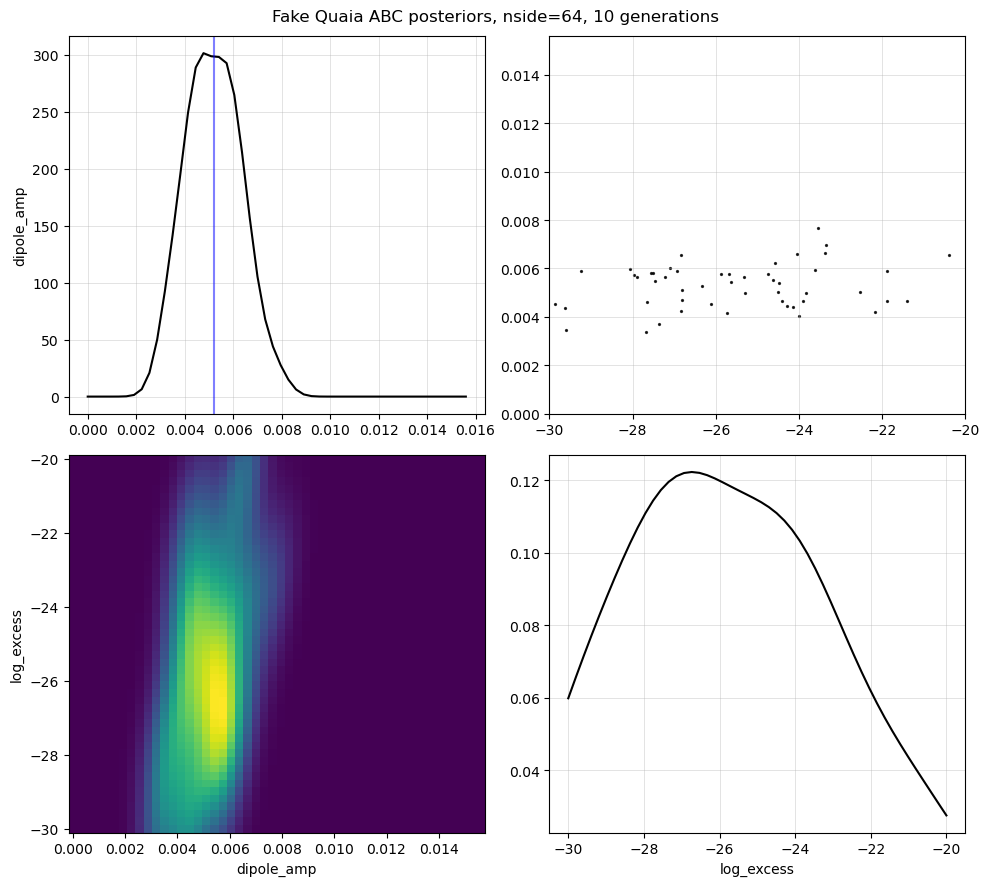

In [32]:
# posterior
prior_dict = dict(dipole_amp=dipole_amp_bounds, log_excess=log_excess_bounds)
par_ids = [x for x in prior_dict.keys()]
fig, axs = plt.subplots(len(par_ids), len(par_ids), figsize=(10,9), tight_layout=True)
df, w = history.get_distribution()

for i in range(len(par_ids)):

    # diagonal
    ax = axs[i, i]
    x, pdf = tools.get_kde_1d(history, prior_dict, par_ids[i])
    ax.plot(x, pdf, c='k')
    ax.grid(alpha=0.5, lw=0.5)
    if i == 0:
        ax.axvline(0.0052, c='b', alpha=0.5)

    axs[i,0].set_ylabel(par_ids[i])
    axs[len(par_ids)-1,i].set_xlabel(par_ids[i])

    for j in range(0, i):

        # lower
        ax = axs[i, j]
        x, y, pdf = tools.get_kde_2d(history, prior_dict, par_ids[j], par_ids[i])
        mesh = ax.pcolormesh(x, y, pdf, shading='auto')

        # upper
        ax = axs[j, i]
        tools.scatter(history, prior_dict, par_ids[i], par_ids[j], ax, color='k', alpha=0.8, marker='.', s=7)
        ax.grid(alpha=0.5, lw=0.5)
        
fig.suptitle(f'Fake Quaia ABC posteriors, nside={nside}, {history.max_t +1} generations')

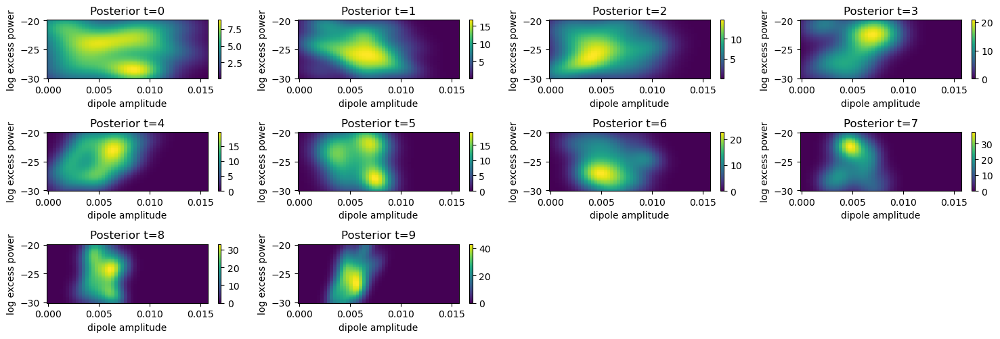

In [33]:
# evolution of the posterior
fig = plt.figure(figsize=(15, 8), tight_layout=True)
for t in range(history.max_t + 1):
    ax = fig.add_subplot((history.max_t + 1) // 2, 4, t + 1)
    df, w = history.get_distribution(t=t)
    ax = pyabc.visualization.plot_kde_2d(
        df,
        w,
        x="dipole_amp",
        xname=r"dipole amplitude",
        xmin=prior_dict['dipole_amp'][0],
        xmax=prior_dict['dipole_amp'][0] + prior_dict['dipole_amp'][1],
        y="log_excess",
        yname=r"log excess power",
        ymin=prior_dict['log_excess'][0],
        ymax=prior_dict['log_excess'][0] + prior_dict['log_excess'][1],
        ax=ax
    )
    ax.set_title(f"Posterior t={t}")

#### perfect completeness, expected dipole, ZERO excess power, base rate

In [22]:
selfunc = np.ones(hp.nside2npix(nside))
base_rate = 33.6330  # mean base rate of the final 100 accepted samples for Quaia, 14 generations
expected_dipole_amp = 0.0052
data_pars = dict(dipole_amp=expected_dipole_amp, log_excess=0.)
ell_max = 8

# define a model wrapper for this case
def model_wrapper(parameters):  
    return model(parameters, selfunc, base_rate, cmb_dipdir, theta, phi, ell_max)

ideal_data = model_wrapper(data_pars)
smoothed_ideal_data = tools.smooth_map(ideal_data['data'], verbose=False)

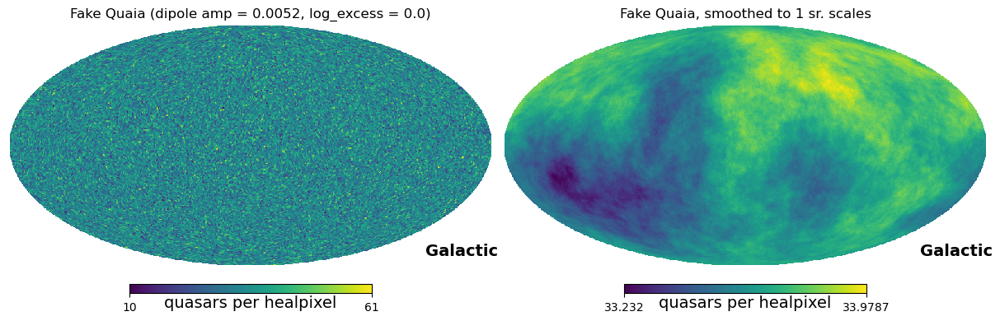

In [24]:
fig = plt.figure(figsize=(12,4), tight_layout=True)
kwargs = dict(coord=['C','G'], unit='quasars per healpixel', cmap='viridis', fig=fig)
hp.mollview(ideal_data['data'], title=f"Fake Quaia (dipole amp = {data_pars['dipole_amp']}, log_excess = {data_pars['log_excess']})",
            sub=(1,2,1), **kwargs)
hp.mollview(smoothed_ideal_data, title=f"Fake Quaia, smoothed to 1 sr. scales", sub=(1,2,2), **kwargs)

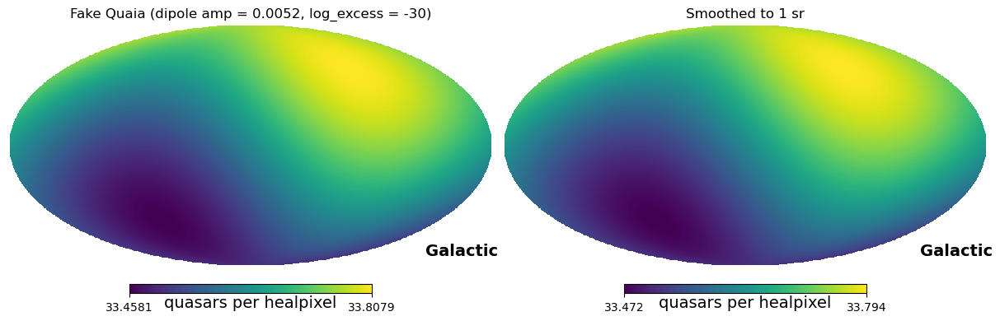

In [42]:
fig = plt.figure(figsize=(12,4), tight_layout=True)
kwargs = dict(coord=['C','G'], unit='quasars per healpixel', cmap='viridis', fig=fig)
hp.mollview(data['data'], title=f"Fake Quaia (dipole amp = {data_pars['dipole_amp']}, log_excess = {data_pars['log_excess']})",
            sub=(1,2,1), **kwargs)
hp.mollview(smoothed_data, title=f"Smoothed to 1 sr", sub=(1,2,2), **kwargs)

In [33]:
sum(ideal_data['data'])

0